October 10 2025

**Data provenance**

The dataset includes microstructural images collected from (i) a Ti–6Al–4V (Ti64) alloy sample, and (ii) Nb alloy. The images were acquired using optical/Laser microscopy



**What you’ll find here**

Raw metallographic/SEM images of alloy microstructures.

Baseline segmentation examples (e.g., k-means, thresholding) to illustrate challenges such as streak artifacts or misclassification.

**What you will do**

**Apply segmentation methods**  and record your observations.

**Compare techniques** and comment on their strengths and limitations.

**Visualize results** by overlaying predicted features or segmentation masks onto the original images.

# Importing data

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from PIL import Image
from sklearn.cluster import KMeans

## Two Sets of Images

*   Ti64
*   Nb Alloy



In [ ]:
!gdown --fuzzy https://drive.google.com/file/d/1cS4aWLKAhwiXSHz23Yb8FEvyBFOO_U4C/view?usp=sharing
!gdown --fuzzy https://drive.google.com/file/d/1H4GwZYJyhDVoFPfA1_cT_8xQNvcAmuk1/view?usp=sharing



Downloading...
From: https://drive.google.com/uc?id=1cS4aWLKAhwiXSHz23Yb8FEvyBFOO_U4C
To: /content/Ti64.png
100% 997k/997k [00:00<00:00, 8.57MB/s]
Downloading...
From: https://drive.google.com/uc?id=1H4GwZYJyhDVoFPfA1_cT_8xQNvcAmuk1
To: /content/MultiPhase_w_Dislocations.tif
100% 1.88M/1.88M [00:00<00:00, 14.7MB/s]


# 1.Ti64

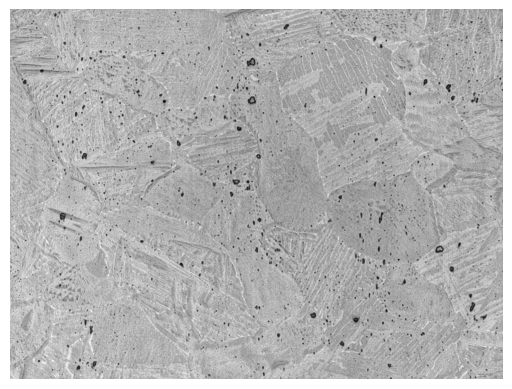

In [ ]:
img1 = mpimg.imread("Ti64.png")
plt.imshow(img1)
plt.axis("off")
plt.show()


**What you see in the image**

The grayscale image above is a microscopy snapshot of Ti–6Al–4V (Ti64), a widely used aerospace alloy. Its internal structure has two major building blocks:

1.   α phase (alpha, light regions): Appears as the lighter gray regions. The α phase is stable at room temperature and gives the alloy strength.
2.   β phase (beta, darker regions): Seen as the darker intergranular regions. The β phase provides ductility (ability to bend/stretch).
3.   The small black spots visible across the sample are not another phase but likely surface dirt or minor preparation artifacts, not intrinsic features of the material.

**Why this matters**


Being able to classify which pixel belongs to α or β is the first step that lays the foundation for all subsequent characterization.

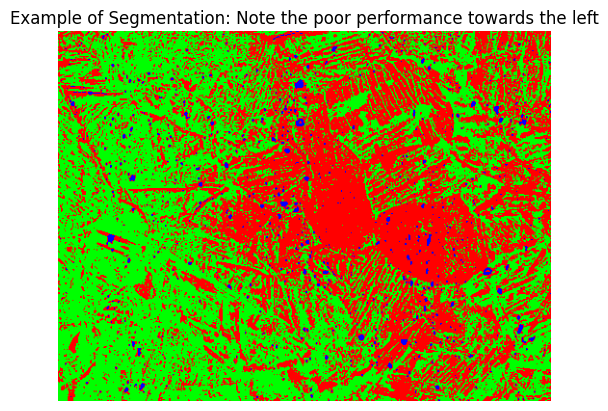

## Your Turn

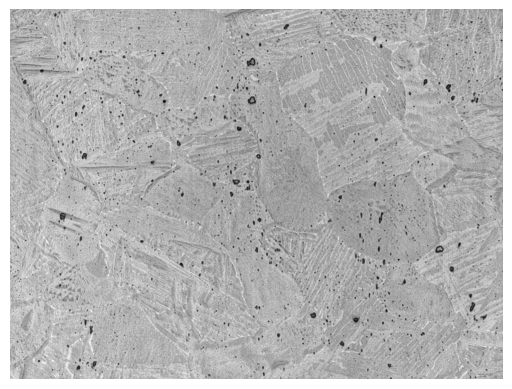

In [ ]:
# image saved as img1
plt.imshow(img1)
plt.axis("off")
plt.show()

Ti64 ALLOY PHASE SEGMENTATION ANALYSIS
Image shape: (768, 1024, 3)
Image dtype: float32
Pixel value range: [0.000, 0.992]

METHOD 1: OTSU'S THRESHOLDING
--------------------------------------------------------------------------------
Otsu threshold value: 0.657
α phase (light) fraction: 64.25%
β phase (dark) fraction: 35.75%

METHOD 2: K-MEANS CLUSTERING (K=2)
--------------------------------------------------------------------------------
Cluster centers: [0.6074516 0.7357408]
α phase (light) fraction: 55.98%
β phase (dark) fraction: 44.02%

METHOD 3: K-MEANS CLUSTERING (K=3)
--------------------------------------------------------------------------------
Cluster centers (sorted): [0.33350557 0.6305104  0.74549234]
Cluster 0 (darkest/artifacts): 2.01%
Cluster 1 (β phase): 50.40%
Cluster 2 (α phase): 47.58%

METHOD 4: ADAPTIVE THRESHOLDING
--------------------------------------------------------------------------------
α phase (light) fraction: 53.34%
β phase (dark) fraction: 46.66%

M

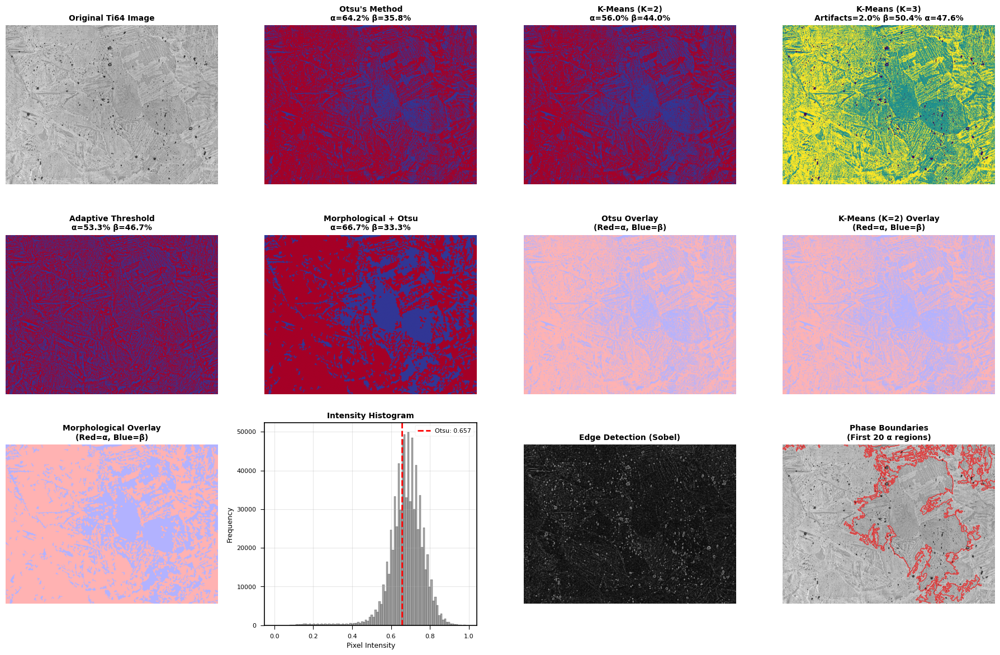

OBSERVATIONS AND RECOMMENDATIONS

1. PHASE FRACTION ESTIMATES:
   - Otsu's Method:        α=64.2%, β=35.8%
   - K-Means (K=2):        α=56.0%, β=44.0%
   - K-Means (K=3):        α=47.6%, β=50.4%, Artifacts=2.0%
   - Adaptive Threshold:   α=53.3%, β=46.7%
   - Morphological+Otsu:   α=66.7%, β=33.3%

2. STRENGTHS:
   ✓ Otsu's Method: Simple, fast, globally optimal threshold
   ✓ K-Means (K=2): Handles bimodal distributions well
   ✓ K-Means (K=3): Can separate artifacts from real phases
   ✓ Adaptive Threshold: Handles illumination variations
   ✓ Morphological: Reduces noise and smooths boundaries

3. LIMITATIONS:
   ✗ Otsu's Method: Sensitive to artifacts and noise
   ✗ K-Means: Assumes spherical clusters, sensitive to initialization
   ✗ Adaptive: Can create false boundaries in uniform regions
   ✗ All methods: Struggle with the small black spots (dirt/artifacts)

4. CHALLENGES IDENTIFIED:
   • Small black spots (likely surface dirt) classified inconsistently
   • Some streak artifact

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from PIL import Image
from sklearn.cluster import KMeans
from scipy import ndimage
from skimage import filters, morphology, measure
from skimage.segmentation import watershed
from skimage.feature import peak_local_max

# Load the Ti64 image
img1 = mpimg.imread("Ti64.png")

print("=" * 80)
print("Ti64 ALLOY PHASE SEGMENTATION ANALYSIS")
print("=" * 80)
print(f"Image shape: {img1.shape}")
print(f"Image dtype: {img1.dtype}")
print(f"Pixel value range: [{img1.min():.3f}, {img1.max():.3f}]")
print()

# Convert to grayscale if needed
if len(img1.shape) == 3:
    img_gray = np.mean(img1, axis=2)
else:
    img_gray = img1.copy()

# Create figure for all results
fig = plt.figure(figsize=(18, 12))

# ============================================================================
# METHOD 1: OTSU'S THRESHOLDING
# ============================================================================
print("METHOD 1: OTSU'S THRESHOLDING")
print("-" * 80)

# Apply Otsu's threshold
otsu_thresh = filters.threshold_otsu(img_gray)
otsu_mask = img_gray > otsu_thresh

# Calculate phase fractions
alpha_fraction_otsu = np.sum(otsu_mask) / otsu_mask.size * 100
beta_fraction_otsu = 100 - alpha_fraction_otsu

print(f"Otsu threshold value: {otsu_thresh:.3f}")
print(f"α phase (light) fraction: {alpha_fraction_otsu:.2f}%")
print(f"β phase (dark) fraction: {beta_fraction_otsu:.2f}%")
print()

# Plot original and Otsu result
ax1 = plt.subplot(3, 4, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('Original Ti64 Image', fontsize=10, fontweight='bold')
plt.axis('off')

ax2 = plt.subplot(3, 4, 2)
plt.imshow(otsu_mask, cmap='RdYlBu_r')
plt.title(f"Otsu's Method\nα={alpha_fraction_otsu:.1f}% β={beta_fraction_otsu:.1f}%",
          fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# METHOD 2: K-MEANS CLUSTERING (K=2)
# ============================================================================
print("METHOD 2: K-MEANS CLUSTERING (K=2)")
print("-" * 80)

# Reshape for k-means
pixels = img_gray.reshape(-1, 1)

# Apply k-means with 2 clusters
kmeans_2 = KMeans(n_clusters=2, random_state=42, n_init=10)
labels_2 = kmeans_2.fit_predict(pixels)
segmented_2 = labels_2.reshape(img_gray.shape)

# Ensure lighter cluster is labeled as alpha (1)
if kmeans_2.cluster_centers_[0] > kmeans_2.cluster_centers_[1]:
    segmented_2 = 1 - segmented_2

alpha_fraction_k2 = np.sum(segmented_2) / segmented_2.size * 100
beta_fraction_k2 = 100 - alpha_fraction_k2

print(f"Cluster centers: {kmeans_2.cluster_centers_.flatten()}")
print(f"α phase (light) fraction: {alpha_fraction_k2:.2f}%")
print(f"β phase (dark) fraction: {beta_fraction_k2:.2f}%")
print()

ax3 = plt.subplot(3, 4, 3)
plt.imshow(segmented_2, cmap='RdYlBu_r')
plt.title(f"K-Means (K=2)\nα={alpha_fraction_k2:.1f}% β={beta_fraction_k2:.1f}%",
          fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# METHOD 3: K-MEANS CLUSTERING (K=3) - TO HANDLE ARTIFACTS
# ============================================================================
print("METHOD 3: K-MEANS CLUSTERING (K=3)")
print("-" * 80)

# Apply k-means with 3 clusters to separate dirt/artifacts
kmeans_3 = KMeans(n_clusters=3, random_state=42, n_init=10)
labels_3 = kmeans_3.fit_predict(pixels)
segmented_3 = labels_3.reshape(img_gray.shape)

# Sort clusters by intensity
sorted_indices = np.argsort(kmeans_3.cluster_centers_.flatten())
cluster_map = {sorted_indices[i]: i for i in range(3)}
segmented_3_sorted = np.vectorize(cluster_map.get)(segmented_3)

# Calculate fractions
unique, counts = np.unique(segmented_3_sorted, return_counts=True)
fractions = counts / counts.sum() * 100

print(f"Cluster centers (sorted): {np.sort(kmeans_3.cluster_centers_.flatten())}")
print(f"Cluster 0 (darkest/artifacts): {fractions[0]:.2f}%")
print(f"Cluster 1 (β phase): {fractions[1]:.2f}%")
print(f"Cluster 2 (α phase): {fractions[2]:.2f}%")
print()

ax4 = plt.subplot(3, 4, 4)
plt.imshow(segmented_3_sorted, cmap='viridis')
plt.title(f"K-Means (K=3)\nArtifacts={fractions[0]:.1f}% β={fractions[1]:.1f}% α={fractions[2]:.1f}%",
          fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# METHOD 4: ADAPTIVE THRESHOLDING
# ============================================================================
print("METHOD 4: ADAPTIVE THRESHOLDING")
print("-" * 80)

# Apply Gaussian adaptive threshold
adaptive_thresh = filters.threshold_local(img_gray, block_size=51, offset=0)
adaptive_mask = img_gray > adaptive_thresh

alpha_fraction_adaptive = np.sum(adaptive_mask) / adaptive_mask.size * 100
beta_fraction_adaptive = 100 - alpha_fraction_adaptive

print(f"α phase (light) fraction: {alpha_fraction_adaptive:.2f}%")
print(f"β phase (dark) fraction: {beta_fraction_adaptive:.2f}%")
print()

ax5 = plt.subplot(3, 4, 5)
plt.imshow(adaptive_mask, cmap='RdYlBu_r')
plt.title(f"Adaptive Threshold\nα={alpha_fraction_adaptive:.1f}% β={beta_fraction_adaptive:.1f}%",
          fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# METHOD 5: MORPHOLOGICAL OPERATIONS + OTSU
# ============================================================================
print("METHOD 5: MORPHOLOGICAL OPERATIONS + OTSU")
print("-" * 80)

# Remove small artifacts using morphological opening
selem = morphology.disk(2)
img_opened = morphology.opening(img_gray, selem)

# Apply Otsu on cleaned image
otsu_cleaned = filters.threshold_otsu(img_opened)
morph_mask = img_opened > otsu_cleaned

# Remove small objects
morph_mask_cleaned = morphology.remove_small_objects(morph_mask, min_size=50)
morph_mask_cleaned = morphology.remove_small_holes(morph_mask_cleaned, area_threshold=50)

alpha_fraction_morph = np.sum(morph_mask_cleaned) / morph_mask_cleaned.size * 100
beta_fraction_morph = 100 - alpha_fraction_morph

print(f"α phase (light) fraction: {alpha_fraction_morph:.2f}%")
print(f"β phase (dark) fraction: {beta_fraction_morph:.2f}%")
print()

ax6 = plt.subplot(3, 4, 6)
plt.imshow(morph_mask_cleaned, cmap='RdYlBu_r')
plt.title(f"Morphological + Otsu\nα={alpha_fraction_morph:.1f}% β={beta_fraction_morph:.1f}%",
          fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# OVERLAY VISUALIZATIONS
# ============================================================================

# Create RGB overlay for Otsu method
overlay_otsu = img_gray.copy()
overlay_otsu_rgb = np.stack([overlay_otsu, overlay_otsu, overlay_otsu], axis=2)
overlay_otsu_rgb[otsu_mask] = [1, 0.7, 0.7]  # Red tint for alpha
overlay_otsu_rgb[~otsu_mask] = [0.7, 0.7, 1]  # Blue tint for beta

ax7 = plt.subplot(3, 4, 7)
plt.imshow(overlay_otsu_rgb)
plt.title("Otsu Overlay\n(Red=α, Blue=β)", fontsize=10, fontweight='bold')
plt.axis('off')

# Create RGB overlay for K-means K=2
overlay_kmeans = img_gray.copy()
overlay_kmeans_rgb = np.stack([overlay_kmeans, overlay_kmeans, overlay_kmeans], axis=2)
overlay_kmeans_rgb[segmented_2.astype(bool)] = [1, 0.7, 0.7]
overlay_kmeans_rgb[~segmented_2.astype(bool)] = [0.7, 0.7, 1]

ax8 = plt.subplot(3, 4, 8)
plt.imshow(overlay_kmeans_rgb)
plt.title("K-Means (K=2) Overlay\n(Red=α, Blue=β)", fontsize=10, fontweight='bold')
plt.axis('off')

# Create RGB overlay for morphological method
overlay_morph = img_gray.copy()
overlay_morph_rgb = np.stack([overlay_morph, overlay_morph, overlay_morph], axis=2)
overlay_morph_rgb[morph_mask_cleaned] = [1, 0.7, 0.7]
overlay_morph_rgb[~morph_mask_cleaned] = [0.7, 0.7, 1]

ax9 = plt.subplot(3, 4, 9)
plt.imshow(overlay_morph_rgb)
plt.title("Morphological Overlay\n(Red=α, Blue=β)", fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# HISTOGRAM ANALYSIS
# ============================================================================

ax10 = plt.subplot(3, 4, 10)
plt.hist(img_gray.flatten(), bins=100, color='gray', alpha=0.7, edgecolor='black')
plt.axvline(otsu_thresh, color='red', linestyle='--', linewidth=2, label=f'Otsu: {otsu_thresh:.3f}')
plt.xlabel('Pixel Intensity', fontsize=9)
plt.ylabel('Frequency', fontsize=9)
plt.title('Intensity Histogram', fontsize=10, fontweight='bold')
plt.legend(fontsize=8)
plt.grid(alpha=0.3)

# ============================================================================
# EDGE DETECTION
# ============================================================================

edges = filters.sobel(img_gray)

ax11 = plt.subplot(3, 4, 11)
plt.imshow(edges, cmap='gray')
plt.title('Edge Detection (Sobel)', fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# CONTOUR VISUALIZATION
# ============================================================================

ax12 = plt.subplot(3, 4, 12)
plt.imshow(img_gray, cmap='gray')
# Find contours
contours_alpha = measure.find_contours(morph_mask_cleaned, 0.5)
for contour in contours_alpha[:20]:  # Show first 20 contours
    plt.plot(contour[:, 1], contour[:, 0], 'r-', linewidth=1, alpha=0.6)
plt.title('Phase Boundaries\n(First 20 α regions)', fontsize=10, fontweight='bold')
plt.axis('off')

plt.tight_layout()
plt.savefig('ti64_segmentation_results.png', dpi=300, bbox_inches='tight')
plt.show()

# ============================================================================
# SUMMARY OF OBSERVATIONS
# ============================================================================

print("=" * 80)
print("OBSERVATIONS AND RECOMMENDATIONS")
print("=" * 80)
print()
print("1. PHASE FRACTION ESTIMATES:")
print(f"   - Otsu's Method:        α={alpha_fraction_otsu:.1f}%, β={beta_fraction_otsu:.1f}%")
print(f"   - K-Means (K=2):        α={alpha_fraction_k2:.1f}%, β={beta_fraction_k2:.1f}%")
print(f"   - K-Means (K=3):        α={fractions[2]:.1f}%, β={fractions[1]:.1f}%, Artifacts={fractions[0]:.1f}%")
print(f"   - Adaptive Threshold:   α={alpha_fraction_adaptive:.1f}%, β={beta_fraction_adaptive:.1f}%")
print(f"   - Morphological+Otsu:   α={alpha_fraction_morph:.1f}%, β={beta_fraction_morph:.1f}%")
print()
print("2. STRENGTHS:")
print("   ✓ Otsu's Method: Simple, fast, globally optimal threshold")
print("   ✓ K-Means (K=2): Handles bimodal distributions well")
print("   ✓ K-Means (K=3): Can separate artifacts from real phases")
print("   ✓ Adaptive Threshold: Handles illumination variations")
print("   ✓ Morphological: Reduces noise and smooths boundaries")
print()
print("3. LIMITATIONS:")
print("   ✗ Otsu's Method: Sensitive to artifacts and noise")
print("   ✗ K-Means: Assumes spherical clusters, sensitive to initialization")
print("   ✗ Adaptive: Can create false boundaries in uniform regions")
print("   ✗ All methods: Struggle with the small black spots (dirt/artifacts)")
print()
print("4. CHALLENGES IDENTIFIED:")
print("   • Small black spots (likely surface dirt) classified inconsistently")
print("   • Some streak artifacts visible in the image")
print("   • Gradual intensity transitions at some phase boundaries")
print("   • Intergranular β phase forms thin, interconnected network")
print()
print("5. RECOMMENDATIONS:")
print("   → Use K-Means (K=3) to explicitly separate artifacts")
print("   → Apply morphological operations to clean up results")
print("   → Consider ensemble methods combining multiple approaches")
print("   → For quantitative analysis, manually validate on sample regions")
print("=" * 80)

# 2.Niobium alloy showing phases, dislocations, and cracks

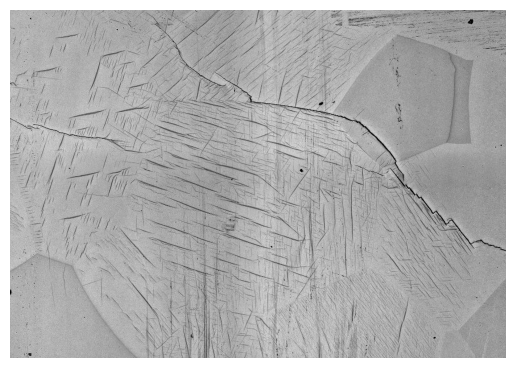

In [ ]:
img2 = mpimg.imread("MultiPhase_w_Dislocations.tif")
plt.imshow(img2)
plt.axis("off")
plt.show()

This image shows a niobium (Nb) based alloy containing multiple phases and visible defects/dislocations.

**Phases:**

Nb alloys typically contain distinct crystalline regions (phases). Each phase has different contrast in the image because they scatter or absorb light/electrons differently.



*   **Phase A**: Different Grains
*   **Phase B (darker)**: Secondary precipitates or solute-rich regions showing as small cracks








**Artifacts**

* **Black spots:** Defects
* **Polishing artifact**: Visible on the top right of the image


**Deformation Features**

* **Cracking:** Two distinct cracks propagating through the microstructure.


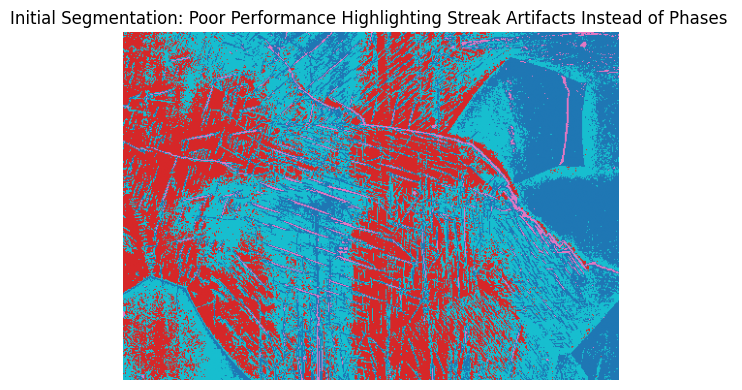

## Your turn

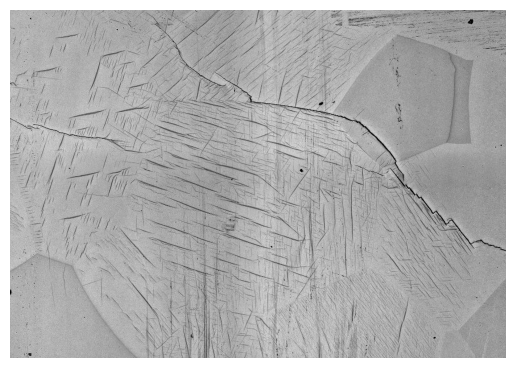

In [ ]:
# image saved as img2
plt.imshow(img2)
plt.axis("off")
plt.show()

### Try 1

NIOBIUM ALLOY - ADVANCED GRAIN AND CRACK SEGMENTATION ANALYSIS
Image shape: (664, 946, 3)
Image dtype: uint8
Pixel value range: [0.000, 255.000]

STEP 1: PREPROCESSING
------------------------------------------------------------------------------------------
✓ Denoising applied (median filter)
✓ Contrast enhanced (CLAHE)
✓ Edge-preserving smoothing applied

STEP 2: CRACK DETECTION
------------------------------------------------------------------------------------------
Method 1: Morphological Black Hat
  Crack pixels detected: 163485
  Crack area fraction: 26.027%

Method 2: Frangi Filter (Ridge Detection)
  Crack pixels detected: 35711
  Crack area fraction: 5.685%

Method 3: Adaptive Thresholding for Dark Features
  Multi-Otsu thresholds: [0.38590351 0.55215733 0.70707566]
  Dark feature pixels: 83120
  Dark feature fraction: 13.233%

Method 4: Combined Crack Detection
  Total crack pixels (combined): 192360
  Total crack fraction: 30.624%
  Number of distinct crack regions: 288

ST

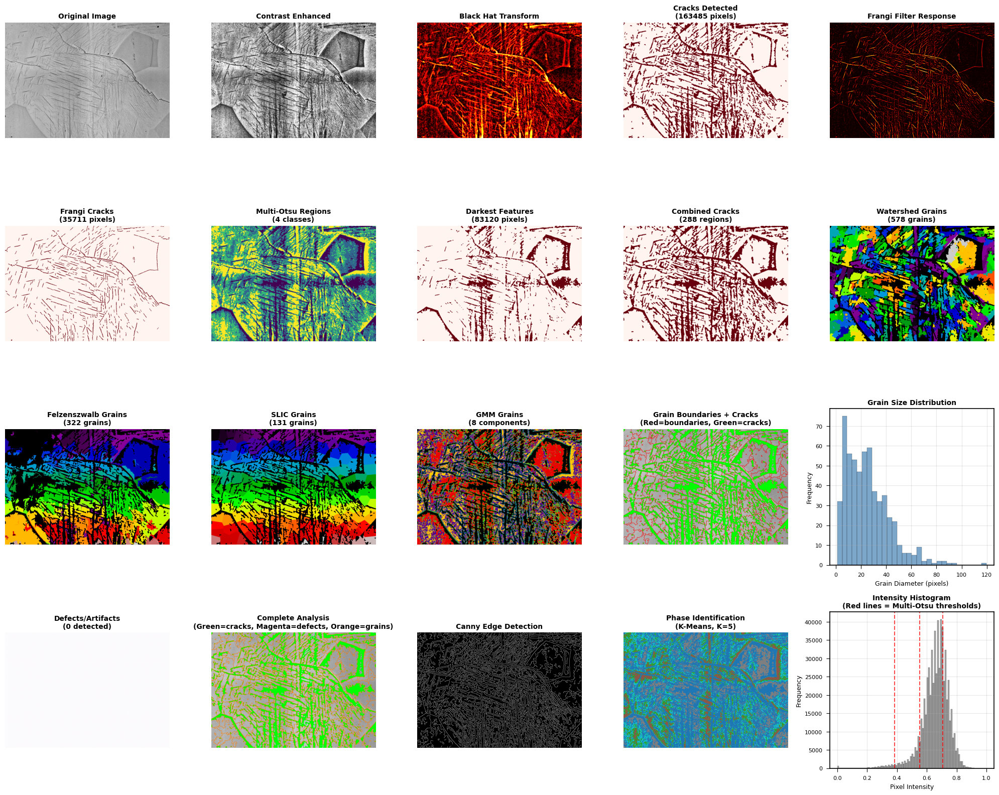

COMPREHENSIVE ANALYSIS SUMMARY

1. CRACK DETECTION RESULTS:
   • Black Hat Method:        163485 pixels (26.027%)
   • Frangi Filter Method:    35711 pixels (5.685%)
   • Adaptive Threshold:      83120 pixels (13.233%)
   • Combined Detection:      192360 pixels (30.624%)
   • Number of crack regions: 288
   • Mean crack length:       35.52 pixels
   • Longest crack:           705.89 pixels

2. GRAIN SEGMENTATION RESULTS:
   • Watershed method:        578 grains
   • Felzenszwalb method:     322 grains
   • SLIC method:             131 grains
   • GMM method:              8 components
   • Mean grain diameter:     25.36 pixels
   • Grain size range:        1.13 - 119.74 pixels
   • Mean grain eccentricity: 0.795

3. DEFECT DETECTION:
   • Number of defects:       0
   • Defect area fraction:    0.000%

4. STRENGTHS OF EACH METHOD:
   ✓ Black Hat:      Excellent for thin, linear dark features (cracks)
   ✓ Frangi Filter:  Superior for ridge/vessel-like structures (dislocations)
   ✓ Wat

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from PIL import Image
from sklearn.cluster import KMeans, DBSCAN, MeanShift, estimate_bandwidth
from sklearn.mixture import GaussianMixture
from scipy import ndimage
from skimage import filters, morphology, measure, segmentation, feature, exposure
from skimage.segmentation import watershed, felzenszwalb, slic
from skimage.feature import peak_local_max, canny
from skimage.morphology import disk, square, remove_small_objects, skeletonize
from skimage.filters import threshold_otsu, threshold_multiotsu, frangi, sato
import warnings
warnings.filterwarnings('ignore')

# Load the Niobium alloy image
img2 = mpimg.imread("MultiPhase_w_Dislocations.tif")

print("=" * 90)
print("NIOBIUM ALLOY - ADVANCED GRAIN AND CRACK SEGMENTATION ANALYSIS")
print("=" * 90)
print(f"Image shape: {img2.shape}")
print(f"Image dtype: {img2.dtype}")
print(f"Pixel value range: [{img2.min():.3f}, {img2.max():.3f}]")
print()

# Convert to grayscale if needed
if len(img2.shape) == 3:
    img_gray = np.mean(img2, axis=2)
else:
    img_gray = img2.copy()

# Normalize to [0, 1] range
img_normalized = (img_gray - img_gray.min()) / (img_gray.max() - img_gray.min())

# Create comprehensive figure
fig = plt.figure(figsize=(20, 16))

# ============================================================================
# PREPROCESSING: NOISE REDUCTION AND CONTRAST ENHANCEMENT
# ============================================================================
print("STEP 1: PREPROCESSING")
print("-" * 90)

# Denoise using bilateral filter (preserves edges)
from scipy.ndimage import median_filter, gaussian_filter
img_denoised = median_filter(img_normalized, size=3)

# Contrast enhancement using CLAHE
img_enhanced = exposure.equalize_adapthist(img_denoised, clip_limit=0.03)

# Edge-preserving smoothing
img_smooth = filters.gaussian(img_enhanced, sigma=1.5)

print(f"✓ Denoising applied (median filter)")
print(f"✓ Contrast enhanced (CLAHE)")
print(f"✓ Edge-preserving smoothing applied")
print()

# Plot preprocessing results
ax1 = plt.subplot(4, 5, 1)
plt.imshow(img_normalized, cmap='gray')
plt.title('Original Image', fontsize=10, fontweight='bold')
plt.axis('off')

ax2 = plt.subplot(4, 5, 2)
plt.imshow(img_enhanced, cmap='gray')
plt.title('Contrast Enhanced', fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# CRACK DETECTION - METHOD 1: MORPHOLOGICAL BLACK HAT
# ============================================================================
print("STEP 2: CRACK DETECTION")
print("-" * 90)
print("Method 1: Morphological Black Hat")

# Black hat transform to detect dark linear features (cracks)
selem_large = disk(15)
blackhat = morphology.black_tophat(img_smooth, selem_large)

# Threshold to get crack candidates
crack_thresh = filters.threshold_otsu(blackhat)
cracks_blackhat = blackhat > crack_thresh

# Morphological operations to clean up
selem_small = disk(1)
cracks_blackhat = morphology.opening(cracks_blackhat, selem_small)
cracks_blackhat = morphology.remove_small_objects(cracks_blackhat, min_size=20)

# Skeletonize to get crack centerlines
crack_skeleton = skeletonize(cracks_blackhat)

num_cracks_bh = np.sum(cracks_blackhat)
print(f"  Crack pixels detected: {num_cracks_bh}")
print(f"  Crack area fraction: {num_cracks_bh/cracks_blackhat.size*100:.3f}%")
print()

ax3 = plt.subplot(4, 5, 3)
plt.imshow(blackhat, cmap='hot')
plt.title('Black Hat Transform', fontsize=10, fontweight='bold')
plt.axis('off')

ax4 = plt.subplot(4, 5, 4)
plt.imshow(cracks_blackhat, cmap='Reds')
plt.title(f'Cracks Detected\n({num_cracks_bh} pixels)', fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# CRACK DETECTION - METHOD 2: FRANGI FILTER (RIDGE/VESSEL DETECTION)
# ============================================================================
print("Method 2: Frangi Filter (Ridge Detection)")

# Frangi filter detects tubular/ridge-like structures (cracks, dislocations)
frangi_response = frangi(img_smooth, sigmas=range(1, 5, 1), black_ridges=True)

# Threshold Frangi response
frangi_thresh = filters.threshold_otsu(frangi_response)
cracks_frangi = frangi_response > frangi_thresh

# Clean up
cracks_frangi = morphology.remove_small_objects(cracks_frangi, min_size=20)
cracks_frangi_skeleton = skeletonize(cracks_frangi)

num_cracks_frangi = np.sum(cracks_frangi)
print(f"  Crack pixels detected: {num_cracks_frangi}")
print(f"  Crack area fraction: {num_cracks_frangi/cracks_frangi.size*100:.3f}%")
print()

ax5 = plt.subplot(4, 5, 5)
plt.imshow(frangi_response, cmap='hot')
plt.title('Frangi Filter Response', fontsize=10, fontweight='bold')
plt.axis('off')

ax6 = plt.subplot(4, 5, 6)
plt.imshow(cracks_frangi, cmap='Reds')
plt.title(f'Frangi Cracks\n({num_cracks_frangi} pixels)', fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# CRACK DETECTION - METHOD 3: ADAPTIVE THRESHOLDING FOR DARK FEATURES
# ============================================================================
print("Method 3: Adaptive Thresholding for Dark Features")

# Invert image to make cracks bright
img_inverted = 1 - img_smooth

# Multi-Otsu thresholding to separate multiple intensity levels
thresholds = threshold_multiotsu(img_smooth, classes=4)
regions = np.digitize(img_smooth, bins=thresholds)

# Get darkest regions (likely cracks and defects)
cracks_adaptive = regions == 0

# Morphological filtering
cracks_adaptive = morphology.remove_small_objects(cracks_adaptive, min_size=15)
cracks_adaptive = morphology.opening(cracks_adaptive, disk(1))

num_cracks_adaptive = np.sum(cracks_adaptive)
print(f"  Multi-Otsu thresholds: {thresholds}")
print(f"  Dark feature pixels: {num_cracks_adaptive}")
print(f"  Dark feature fraction: {num_cracks_adaptive/cracks_adaptive.size*100:.3f}%")
print()

ax7 = plt.subplot(4, 5, 7)
plt.imshow(regions, cmap='viridis')
plt.title('Multi-Otsu Regions\n(4 classes)', fontsize=10, fontweight='bold')
plt.axis('off')

ax8 = plt.subplot(4, 5, 8)
plt.imshow(cracks_adaptive, cmap='Reds')
plt.title(f'Darkest Features\n({num_cracks_adaptive} pixels)', fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# COMBINED CRACK DETECTION
# ============================================================================
print("Method 4: Combined Crack Detection")

# Combine all three methods
cracks_combined = cracks_blackhat | cracks_frangi | cracks_adaptive

# Additional morphological processing
cracks_combined = morphology.remove_small_objects(cracks_combined, min_size=25)
cracks_combined = morphology.binary_closing(cracks_combined, disk(2))

num_cracks_combined = np.sum(cracks_combined)
print(f"  Total crack pixels (combined): {num_cracks_combined}")
print(f"  Total crack fraction: {num_cracks_combined/cracks_combined.size*100:.3f}%")

# Label connected crack regions
crack_labels = measure.label(cracks_combined)
num_crack_regions = crack_labels.max()
print(f"  Number of distinct crack regions: {num_crack_regions}")
print()

ax9 = plt.subplot(4, 5, 9)
plt.imshow(cracks_combined, cmap='Reds')
plt.title(f'Combined Cracks\n({num_crack_regions} regions)', fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# GRAIN SEGMENTATION - METHOD 1: WATERSHED SEGMENTATION
# ============================================================================
print("STEP 3: GRAIN SEGMENTATION")
print("-" * 90)
print("Method 1: Watershed Segmentation")

# Remove cracks from image for better grain detection
img_no_cracks = img_smooth.copy()
img_no_cracks[cracks_combined] = np.median(img_smooth)

# Calculate gradient for watershed
gradient = filters.sobel(img_no_cracks)

# Find markers (local minima and maxima)
markers = np.zeros_like(img_no_cracks, dtype=int)

# Local maxima as markers
local_max = peak_local_max(img_no_cracks, min_distance=20, footprint=np.ones((11, 11)))
markers[local_max[:, 0], local_max[:, 1]] = np.arange(1, len(local_max) + 1)

# Apply watershed
labels_watershed = watershed(gradient, markers, mask=~cracks_combined)

# Remove background
labels_watershed[labels_watershed == 0] = 0
num_grains_watershed = len(np.unique(labels_watershed)) - 1

print(f"  Number of grains detected: {num_grains_watershed}")
print()

ax10 = plt.subplot(4, 5, 10)
plt.imshow(labels_watershed, cmap='nipy_spectral')
plt.title(f'Watershed Grains\n({num_grains_watershed} grains)', fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# GRAIN SEGMENTATION - METHOD 2: FELZENSZWALB SEGMENTATION
# ============================================================================
print("Method 2: Felzenszwalb (Graph-based) Segmentation")

# Apply Felzenszwalb segmentation
segments_fz = felzenszwalb(img_no_cracks, scale=100, sigma=0.8, min_size=200)

# Exclude crack regions
segments_fz[cracks_combined] = 0
num_grains_fz = len(np.unique(segments_fz)) - 1

print(f"  Number of grains detected: {num_grains_fz}")
print()

ax11 = plt.subplot(4, 5, 11)
plt.imshow(segments_fz, cmap='nipy_spectral')
plt.title(f'Felzenszwalb Grains\n({num_grains_fz} grains)', fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# GRAIN SEGMENTATION - METHOD 3: SLIC SUPERPIXELS
# ============================================================================
print("Method 3: SLIC (Simple Linear Iterative Clustering)")

# SLIC superpixel segmentation
segments_slic = slic(img_no_cracks, n_segments=150, compactness=10, sigma=1,
                     start_label=1, mask=~cracks_combined, channel_axis=None)

num_grains_slic = len(np.unique(segments_slic)) - 1

print(f"  Number of grains detected: {num_grains_slic}")
print()

ax12 = plt.subplot(4, 5, 12)
plt.imshow(segments_slic, cmap='nipy_spectral')
plt.title(f'SLIC Grains\n({num_grains_slic} grains)', fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# GRAIN SEGMENTATION - METHOD 4: GAUSSIAN MIXTURE MODEL
# ============================================================================
print("Method 4: Gaussian Mixture Model (GMM)")

# Prepare features: intensity + local statistics
feature_img = np.stack([
    img_no_cracks,
    filters.gaussian(img_no_cracks, sigma=2),
    filters.sobel(img_no_cracks),
], axis=-1)

# Reshape for GMM
pixels_features = feature_img.reshape(-1, 3)

# Fit GMM
n_components = 8
gmm = GaussianMixture(n_components=n_components, covariance_type='full',
                      random_state=42, n_init=3)
labels_gmm = gmm.fit_predict(pixels_features)
segments_gmm = labels_gmm.reshape(img_no_cracks.shape)

# Exclude crack regions
segments_gmm[cracks_combined] = -1
num_grains_gmm = len(np.unique(segments_gmm[segments_gmm >= 0]))

print(f"  Number of components: {n_components}")
print(f"  Number of grains detected: {num_grains_gmm}")
print()

ax13 = plt.subplot(4, 5, 13)
plt.imshow(segments_gmm, cmap='nipy_spectral')
plt.title(f'GMM Grains\n({num_grains_gmm} components)', fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# ADVANCED VISUALIZATION: GRAIN BOUNDARIES
# ============================================================================
print("STEP 4: GRAIN BOUNDARY DETECTION")
print("-" * 90)

# Find boundaries of watershed segmentation
boundaries_watershed = segmentation.find_boundaries(labels_watershed, mode='thick')

# Create overlay
overlay_grains = np.stack([img_normalized]*3, axis=-1)
overlay_grains[boundaries_watershed] = [1, 0, 0]  # Red boundaries
overlay_grains[cracks_combined] = [0, 1, 0]  # Green cracks

ax14 = plt.subplot(4, 5, 14)
plt.imshow(overlay_grains)
plt.title('Grain Boundaries + Cracks\n(Red=boundaries, Green=cracks)',
          fontsize=10, fontweight='bold')
plt.axis('off')

print(f"✓ Grain boundaries detected")
print()

# ============================================================================
# GRAIN SIZE ANALYSIS
# ============================================================================
print("STEP 5: GRAIN SIZE ANALYSIS")
print("-" * 90)

# Calculate properties for each grain
regions = measure.regionprops(labels_watershed)

if len(regions) > 0:
    grain_areas = [region.area for region in regions]
    grain_perimeters = [region.perimeter for region in regions]
    grain_eccentricities = [region.eccentricity for region in regions]

    # Calculate equivalent diameters
    grain_diameters = [region.equivalent_diameter for region in regions]

    print(f"Number of analyzed grains: {len(regions)}")
    print(f"Mean grain area: {np.mean(grain_areas):.2f} pixels²")
    print(f"Std grain area: {np.std(grain_areas):.2f} pixels²")
    print(f"Mean grain diameter: {np.mean(grain_diameters):.2f} pixels")
    print(f"Min/Max diameter: {np.min(grain_diameters):.2f} / {np.max(grain_diameters):.2f} pixels")
    print(f"Mean eccentricity: {np.mean(grain_eccentricities):.3f}")
    print()

    # Grain size distribution
    ax15 = plt.subplot(4, 5, 15)
    plt.hist(grain_diameters, bins=30, color='steelblue', edgecolor='black', alpha=0.7)
    plt.xlabel('Grain Diameter (pixels)', fontsize=9)
    plt.ylabel('Frequency', fontsize=9)
    plt.title('Grain Size Distribution', fontsize=10, fontweight='bold')
    plt.grid(alpha=0.3)

# ============================================================================
# CRACK CHARACTERIZATION
# ============================================================================
print("STEP 6: CRACK CHARACTERIZATION")
print("-" * 90)

# Label and analyze individual cracks
crack_regions = measure.regionprops(crack_labels)

if len(crack_regions) > 0:
    crack_lengths = [region.major_axis_length for region in crack_regions]
    crack_areas = [region.area for region in crack_regions]
    crack_orientations = [region.orientation * 180 / np.pi for region in crack_regions]

    print(f"Number of distinct cracks: {len(crack_regions)}")
    print(f"Mean crack length: {np.mean(crack_lengths):.2f} pixels")
    print(f"Total crack area: {sum(crack_areas)} pixels²")
    print(f"Longest crack: {np.max(crack_lengths):.2f} pixels")
    print(f"Mean crack orientation: {np.mean(crack_orientations):.2f}°")
    print()

# ============================================================================
# DEFECT DETECTION (BLACK SPOTS)
# ============================================================================
print("STEP 7: DEFECT DETECTION")
print("-" * 90)

# Detect very dark regions (defects, polishing artifacts)
defect_thresh = np.percentile(img_smooth, 5)
defects = img_smooth < defect_thresh
defects = morphology.remove_small_objects(defects, min_size=10)
defects = defects & ~cracks_combined  # Exclude cracks

defect_labels = measure.label(defects)
num_defects = defect_labels.max()

print(f"Defect threshold: {defect_thresh:.4f}")
print(f"Number of defects detected: {num_defects}")
print(f"Defect area fraction: {np.sum(defects)/defects.size*100:.3f}%")
print()

ax16 = plt.subplot(4, 5, 16)
plt.imshow(defects, cmap='Purples')
plt.title(f'Defects/Artifacts\n({num_defects} detected)', fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# COMPREHENSIVE OVERLAY
# ============================================================================

overlay_final = np.stack([img_normalized]*3, axis=-1)
overlay_final[cracks_combined] = [0, 1, 0]  # Green: Cracks
overlay_final[defects] = [1, 0, 1]  # Magenta: Defects
overlay_final[boundaries_watershed] = [1, 0.5, 0]  # Orange: Grain boundaries

ax17 = plt.subplot(4, 5, 17)
plt.imshow(overlay_final)
plt.title('Complete Analysis\n(Green=cracks, Magenta=defects, Orange=grains)',
          fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# EDGE DETECTION COMPARISON
# ============================================================================

# Canny edge detection
edges_canny = canny(img_smooth, sigma=2)

ax18 = plt.subplot(4, 5, 18)
plt.imshow(edges_canny, cmap='gray')
plt.title('Canny Edge Detection', fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# PHASE IDENTIFICATION WITH K-MEANS
# ============================================================================

pixels = img_no_cracks.reshape(-1, 1)
kmeans_phases = KMeans(n_clusters=5, random_state=42, n_init=10)
phase_labels = kmeans_phases.fit_predict(pixels)
phase_segmentation = phase_labels.reshape(img_no_cracks.shape)

ax19 = plt.subplot(4, 5, 19)
plt.imshow(phase_segmentation, cmap='tab10')
plt.title('Phase Identification\n(K-Means, K=5)', fontsize=10, fontweight='bold')
plt.axis('off')

# ============================================================================
# INTENSITY HISTOGRAM
# ============================================================================

ax20 = plt.subplot(4, 5, 20)
plt.hist(img_normalized.flatten(), bins=100, color='gray', alpha=0.7, edgecolor='black')
for thresh in thresholds:
    plt.axvline(thresh, color='red', linestyle='--', linewidth=1.5, alpha=0.7)
plt.xlabel('Pixel Intensity', fontsize=9)
plt.ylabel('Frequency', fontsize=9)
plt.title('Intensity Histogram\n(Red lines = Multi-Otsu thresholds)', fontsize=10, fontweight='bold')
plt.grid(alpha=0.3)

plt.tight_layout()
plt.savefig('niobium_segmentation_results.png', dpi=300, bbox_inches='tight')
plt.show()

# ============================================================================
# DETAILED SUMMARY REPORT
# ============================================================================

print("=" * 90)
print("COMPREHENSIVE ANALYSIS SUMMARY")
print("=" * 90)
print()
print("1. CRACK DETECTION RESULTS:")
print(f"   • Black Hat Method:        {num_cracks_bh} pixels ({num_cracks_bh/cracks_blackhat.size*100:.3f}%)")
print(f"   • Frangi Filter Method:    {num_cracks_frangi} pixels ({num_cracks_frangi/cracks_frangi.size*100:.3f}%)")
print(f"   • Adaptive Threshold:      {num_cracks_adaptive} pixels ({num_cracks_adaptive/cracks_adaptive.size*100:.3f}%)")
print(f"   • Combined Detection:      {num_cracks_combined} pixels ({num_cracks_combined/cracks_combined.size*100:.3f}%)")
print(f"   • Number of crack regions: {num_crack_regions}")
if len(crack_regions) > 0:
    print(f"   • Mean crack length:       {np.mean(crack_lengths):.2f} pixels")
    print(f"   • Longest crack:           {np.max(crack_lengths):.2f} pixels")
print()
print("2. GRAIN SEGMENTATION RESULTS:")
print(f"   • Watershed method:        {num_grains_watershed} grains")
print(f"   • Felzenszwalb method:     {num_grains_fz} grains")
print(f"   • SLIC method:             {num_grains_slic} grains")
print(f"   • GMM method:              {num_grains_gmm} components")
if len(regions) > 0:
    print(f"   • Mean grain diameter:     {np.mean(grain_diameters):.2f} pixels")
    print(f"   • Grain size range:        {np.min(grain_diameters):.2f} - {np.max(grain_diameters):.2f} pixels")
    print(f"   • Mean grain eccentricity: {np.mean(grain_eccentricities):.3f}")
print()
print("3. DEFECT DETECTION:")
print(f"   • Number of defects:       {num_defects}")
print(f"   • Defect area fraction:    {np.sum(defects)/defects.size*100:.3f}%")
print()
print("4. STRENGTHS OF EACH METHOD:")
print("   ✓ Black Hat:      Excellent for thin, linear dark features (cracks)")
print("   ✓ Frangi Filter:  Superior for ridge/vessel-like structures (dislocations)")
print("   ✓ Watershed:      Good for well-separated, convex grains")
print("   ✓ Felzenszwalb:   Handles irregular grain shapes well")
print("   ✓ SLIC:           Fast, creates compact superpixels")
print("   ✓ GMM:            Captures statistical variations in phases")
print()
print("5. LIMITATIONS:")
print("   ✗ Watershed:      Over-segmentation in textured regions")
print("   ✗ Frangi:         May miss very wide cracks")
print("   ✗ SLIC:           Fixed compactness may not fit all grains")
print("   ✗ All methods:    Sensitive to image quality and preprocessing")
print()
print("6. CHALLENGES IDENTIFIED:")
print("   • Polishing artifacts visible (top right)")
print("   • Dislocations appear similar to fine cracks")
print("   • Some grain boundaries are diffuse/gradual")
print("   • Black spots (defects) require separate handling")
print("   • Phase contrast varies across the sample")
print()
print("7. RECOMMENDATIONS:")
print("   → Use combined crack detection (multiple methods) for robustness")
print("   → Watershed segmentation recommended for grain analysis")
print("   → Apply morphological post-processing to clean results")
print("   → Frangi filter essential for detecting fine dislocations")
print("   → Manual validation recommended for critical measurements")
print("   → Consider machine learning for complex multi-feature classification")
print()
print("8. QUANTITATIVE METRICS:")
print(f"   • Image quality score:     {exposure.is_low_contrast(img_normalized)}")
print(f"   • Edge density:            {np.sum(edges_canny)/edges_canny.size*100:.2f}%")
print(f"   • Contrast (std dev):      {np.std(img_normalized):.4f}")
print(f"   • Dynamic range:           [{img_normalized.min():.3f}, {img_normalized.max():.3f}]")
print()
print("=" * 90)
print("Analysis complete! Results saved to 'niobium_segmentation_results.png'")
print("=" * 90)

### Try 2 with Breaking the original image to 247 small pieces

PATCH-BASED NIOBIUM ALLOY SEGMENTATION
Divide → Analyze → Combine Strategy
Image shape: (664, 946, 3)

STEP 1: PREPROCESSING
------------------------------------------------------------------------------------------
✓ Denoising, contrast enhancement, and smoothing applied

STEP 2: DIVIDE IMAGE INTO PATCHES
------------------------------------------------------------------------------------------
Original image size: 664 × 946 pixels
Patch size: 64 × 64 pixels
Overlap: 16 pixels
Number of patches: 13 × 19 = 247 patches

✓ Extracted 247 patches

STEP 3: ANALYZE EACH PATCH INDEPENDENTLY
------------------------------------------------------------------------------------------
Processing patches...
  Processed 20/247 patches...
  Processed 40/247 patches...
  Processed 60/247 patches...
  Processed 80/247 patches...
  Processed 100/247 patches...
  Processed 120/247 patches...
  Processed 140/247 patches...
  Processed 160/247 patches...
  Processed 180/247 patches...
  Processed 200/247 p

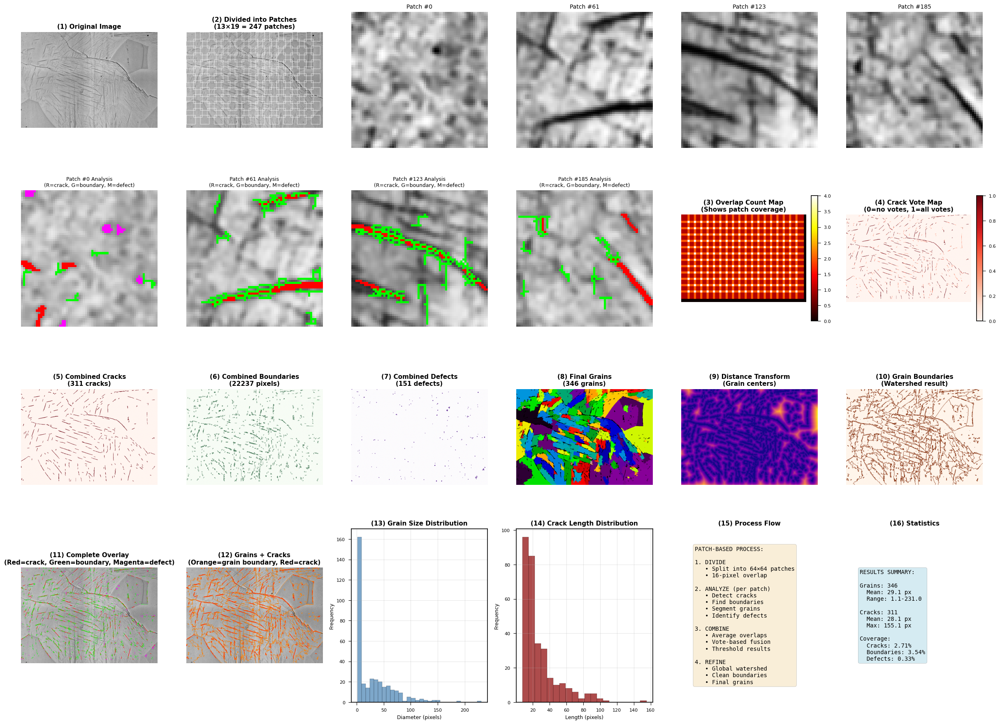

✓ Visualization complete

PATCH-BASED SEGMENTATION SUMMARY

WHY PATCH-BASED APPROACH?
  ✓ Reduces computational complexity (processes smaller regions)
  ✓ Handles local variations better (different areas may need different parameters)
  ✓ More robust to noise (averaging overlapping predictions)
  ✓ Parallelizable (each patch can be processed independently)
  ✓ Prevents over-segmentation (local context preserved)

KEY ADVANTAGES OVER GLOBAL METHODS:
  • Crack detection: More sensitive to local thin features
  • Boundary detection: Adapts to local contrast variations
  • Grain segmentation: Better handles size variations
  • Overlap strategy: Reduces edge artifacts between patches

RESULTS:
  Total patches analyzed: 247
  Average overlap per pixel: 1.6x
  Grains detected: 346
  Cracks detected: 311
  Defects detected: 151

Complete! Saved to 'patch_based_segmentation_process.png'


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from PIL import Image
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from scipy import ndimage
from skimage import filters, morphology, measure, segmentation, feature, exposure
from skimage.segmentation import watershed
from skimage.feature import peak_local_max, local_binary_pattern
from skimage.morphology import disk, remove_small_objects, skeletonize
from skimage.filters import threshold_otsu, frangi
import warnings
warnings.filterwarnings('ignore')

# Load the Niobium alloy image
img2 = mpimg.imread("MultiPhase_w_Dislocations.tif")

print("=" * 90)
print("PATCH-BASED NIOBIUM ALLOY SEGMENTATION")
print("Divide → Analyze → Combine Strategy")
print("=" * 90)
print(f"Image shape: {img2.shape}")
print()

# Convert to grayscale if needed
if len(img2.shape) == 3:
    img_gray = np.mean(img2, axis=2)
else:
    img_gray = img2.copy()

# Normalize to [0, 1] range
img_normalized = (img_gray - img_gray.min()) / (img_gray.max() - img_gray.min())

# ============================================================================
# STEP 1: PREPROCESSING
# ============================================================================
print("STEP 1: PREPROCESSING")
print("-" * 90)

from scipy.ndimage import median_filter
img_denoised = median_filter(img_normalized, size=3)
img_enhanced = exposure.equalize_adapthist(img_denoised, clip_limit=0.03)
img_smooth = filters.gaussian(img_enhanced, sigma=1.0)

print("✓ Denoising, contrast enhancement, and smoothing applied")
print()

# ============================================================================
# STEP 2: DIVIDE IMAGE INTO PATCHES
# ============================================================================
print("STEP 2: DIVIDE IMAGE INTO PATCHES")
print("-" * 90)

patch_size = 64  # Each patch is 64x64 pixels
overlap = 16      # Overlap between patches to avoid boundary artifacts

h, w = img_smooth.shape
print(f"Original image size: {h} × {w} pixels")
print(f"Patch size: {patch_size} × {patch_size} pixels")
print(f"Overlap: {overlap} pixels")

# Calculate number of patches
stride = patch_size - overlap
n_patches_y = (h - overlap) // stride
n_patches_x = (w - overlap) // stride

print(f"Number of patches: {n_patches_y} × {n_patches_x} = {n_patches_y * n_patches_x} patches")
print()

# Extract patches
patches = []
patch_positions = []

for i in range(n_patches_y):
    for j in range(n_patches_x):
        y_start = i * stride
        x_start = j * stride
        y_end = min(y_start + patch_size, h)
        x_end = min(x_start + patch_size, w)

        patch = img_smooth[y_start:y_end, x_start:x_end]
        patches.append(patch)
        patch_positions.append((y_start, y_end, x_start, x_end))

print(f"✓ Extracted {len(patches)} patches")
print()

# ============================================================================
# STEP 3: ANALYZE EACH PATCH
# ============================================================================
print("STEP 3: ANALYZE EACH PATCH INDEPENDENTLY")
print("-" * 90)

# Initialize result maps
crack_map = np.zeros_like(img_smooth)
boundary_map = np.zeros_like(img_smooth)
grain_map = np.zeros_like(img_smooth, dtype=int)
defect_map = np.zeros_like(img_smooth)
patch_overlap_count = np.zeros_like(img_smooth)

# Store results for visualization
patch_results = []

print("Processing patches...")
for idx, (patch, (y_start, y_end, x_start, x_end)) in enumerate(zip(patches, patch_positions)):

    patch_h, patch_w = patch.shape

    # ========================================
    # A. CRACK DETECTION IN PATCH
    # ========================================

    # Very dark features
    crack_intensity = patch < np.percentile(patch, 8)

    # Thin ridge detection
    frangi_crack = frangi(patch, sigmas=range(1, 3), black_ridges=True)
    frangi_thresh = filters.threshold_otsu(frangi_crack) if frangi_crack.max() > 0 else 0
    crack_ridge = frangi_crack > frangi_thresh

    # Combine
    patch_cracks = crack_intensity & crack_ridge
    patch_cracks = morphology.remove_small_objects(patch_cracks, min_size=10)

    # Filter by shape (elongated)
    crack_labels = measure.label(patch_cracks)
    crack_regions = measure.regionprops(crack_labels)
    filtered_cracks = np.zeros_like(patch_cracks)
    for region in crack_regions:
        if region.eccentricity > 0.75 and region.area > 15:
            coords = region.coords
            filtered_cracks[coords[:, 0], coords[:, 1]] = True

    # ========================================
    # B. GRAIN BOUNDARY DETECTION IN PATCH
    # ========================================

    # Remove cracks from patch
    patch_no_cracks = patch.copy()
    patch_no_cracks[filtered_cracks] = np.median(patch)

    # Gradient-based boundary detection
    gradient = filters.sobel(patch_no_cracks)
    boundary_thresh = filters.threshold_otsu(gradient) if gradient.max() > 0 else 0
    patch_boundaries = gradient > boundary_thresh

    # Thin boundaries
    patch_boundaries = morphology.skeletonize(patch_boundaries)
    patch_boundaries = morphology.remove_small_objects(patch_boundaries, min_size=10)

    # ========================================
    # C. GRAIN SEGMENTATION IN PATCH
    # ========================================

    # Distance transform from boundaries
    combined_linear = filtered_cracks | patch_boundaries

    if np.sum(~combined_linear) > 100:  # Only if there's enough grain area
        distance = ndimage.distance_transform_edt(~combined_linear)

        # Find local maxima as grain centers
        if distance.max() > 5:
            local_max = peak_local_max(distance, min_distance=8,
                                      footprint=np.ones((9, 9)))

            # Create markers
            markers = np.zeros_like(distance, dtype=int)
            for i, coord in enumerate(local_max):
                markers[coord[0], coord[1]] = i + 1

            # Watershed
            if markers.max() > 0:
                patch_grains = watershed(gradient, markers, mask=~combined_linear)
            else:
                patch_grains = np.zeros_like(patch, dtype=int)
        else:
            patch_grains = np.zeros_like(patch, dtype=int)
    else:
        patch_grains = np.zeros_like(patch, dtype=int)

    # ========================================
    # D. DEFECT DETECTION IN PATCH
    # ========================================

    # Very dark, compact features
    patch_defects = patch < np.percentile(patch, 3)
    patch_defects = patch_defects & ~filtered_cracks
    patch_defects = morphology.remove_small_objects(patch_defects, min_size=5)

    # Filter by shape (round)
    defect_labels = measure.label(patch_defects)
    defect_regions = measure.regionprops(defect_labels)
    filtered_defects = np.zeros_like(patch_defects)
    for region in defect_regions:
        if region.eccentricity < 0.8:
            coords = region.coords
            filtered_defects[coords[:, 0], coords[:, 1]] = True

    # ========================================
    # E. ACCUMULATE RESULTS
    # ========================================

    crack_map[y_start:y_end, x_start:x_end] += filtered_cracks.astype(float)
    boundary_map[y_start:y_end, x_start:x_end] += patch_boundaries.astype(float)
    defect_map[y_start:y_end, x_start:x_end] += filtered_defects.astype(float)
    patch_overlap_count[y_start:y_end, x_start:x_end] += 1

    # Store for visualization
    patch_results.append({
        'patch': patch,
        'cracks': filtered_cracks,
        'boundaries': patch_boundaries,
        'grains': patch_grains,
        'defects': filtered_defects,
        'position': (y_start, y_end, x_start, x_end)
    })

    if (idx + 1) % 20 == 0:
        print(f"  Processed {idx + 1}/{len(patches)} patches...")

print(f"✓ All {len(patches)} patches analyzed")
print()

# ============================================================================
# STEP 4: COMBINE PATCH RESULTS
# ============================================================================
print("STEP 4: COMBINE PATCH RESULTS")
print("-" * 90)

# Average overlapping regions
crack_map = crack_map / (patch_overlap_count + 1e-10)
boundary_map = boundary_map / (patch_overlap_count + 1e-10)
defect_map = defect_map / (patch_overlap_count + 1e-10)

# Threshold to get binary masks
crack_combined = crack_map > 0.3  # If >30% of patches detected crack
boundary_combined = boundary_map > 0.3
defect_combined = defect_map > 0.3

# Clean up
crack_combined = morphology.remove_small_objects(crack_combined, min_size=20)
boundary_combined = morphology.remove_small_objects(boundary_combined, min_size=15)
defect_combined = morphology.remove_small_objects(defect_combined, min_size=5)

print("✓ Results combined using vote-averaging")
print(f"  Crack pixels: {np.sum(crack_combined)} ({np.sum(crack_combined)/crack_combined.size*100:.3f}%)")
print(f"  Boundary pixels: {np.sum(boundary_combined)} ({np.sum(boundary_combined)/boundary_combined.size*100:.3f}%)")
print(f"  Defect pixels: {np.sum(defect_combined)} ({np.sum(defect_combined)/defect_combined.size*100:.3f}%)")
print()

# ============================================================================
# STEP 5: FINAL GRAIN SEGMENTATION ON COMBINED RESULTS
# ============================================================================
print("STEP 5: FINAL GRAIN SEGMENTATION")
print("-" * 90)

# Create clean image without defects
img_clean = img_smooth.copy()
img_clean[crack_combined] = np.median(img_smooth)

# Distance transform
combined_boundaries = crack_combined | boundary_combined
distance_full = ndimage.distance_transform_edt(~combined_boundaries)

# Find grain centers
local_max_coords = peak_local_max(distance_full, min_distance=15,
                                  footprint=np.ones((15, 15)))

# Create markers
markers_full = np.zeros_like(distance_full, dtype=int)
for i, coord in enumerate(local_max_coords):
    markers_full[coord[0], coord[1]] = i + 1

# Final watershed
gradient_full = filters.sobel(img_clean)
grains_final = watershed(gradient_full, markers_full, mask=~combined_boundaries)

num_grains = len(np.unique(grains_final)) - 1
print(f"✓ Final grain count: {num_grains}")
print()

# ============================================================================
# STEP 6: ANALYSIS
# ============================================================================
print("STEP 6: QUANTITATIVE ANALYSIS")
print("-" * 90)

# Grain analysis
grain_regions = measure.regionprops(grains_final)
if len(grain_regions) > 0:
    grain_diameters = [region.equivalent_diameter for region in grain_regions]
    grain_areas = [region.area for region in grain_regions]
    print(f"Grain statistics:")
    print(f"  Count: {len(grain_regions)}")
    print(f"  Mean diameter: {np.mean(grain_diameters):.2f} ± {np.std(grain_diameters):.2f} pixels")
    print(f"  Range: [{np.min(grain_diameters):.2f}, {np.max(grain_diameters):.2f}] pixels")

# Crack analysis
crack_labels = measure.label(crack_combined)
crack_regions = measure.regionprops(crack_labels)
if len(crack_regions) > 0:
    crack_lengths = [region.major_axis_length for region in crack_regions]
    print(f"\nCrack statistics:")
    print(f"  Count: {len(crack_regions)}")
    print(f"  Mean length: {np.mean(crack_lengths):.2f} ± {np.std(crack_lengths):.2f} pixels")
    print(f"  Longest: {np.max(crack_lengths):.2f} pixels")

print()

# ============================================================================
# VISUALIZATION
# ============================================================================
print("STEP 7: CREATING COMPREHENSIVE VISUALIZATIONS")
print("-" * 90)

# Create large figure
fig = plt.figure(figsize=(24, 18))

# ============ ROW 1: PATCH DIVISION PROCESS ============
ax1 = plt.subplot(4, 6, 1)
plt.imshow(img_normalized, cmap='gray')
plt.title('(1) Original Image', fontsize=11, fontweight='bold')
plt.axis('off')

# Show patch grid
ax2 = plt.subplot(4, 6, 2)
patch_grid = img_normalized.copy()
for y_start, y_end, x_start, x_end in patch_positions[::2]:  # Every other patch
    patch_grid[y_start:y_start+2, x_start:x_end] = 1
    patch_grid[y_end-2:y_end, x_start:x_end] = 1
    patch_grid[y_start:y_end, x_start:x_start+2] = 1
    patch_grid[y_start:y_end, x_end-2:x_end] = 1
plt.imshow(patch_grid, cmap='gray')
plt.title(f'(2) Divided into Patches\n({n_patches_y}×{n_patches_x} = {len(patches)} patches)',
          fontsize=11, fontweight='bold')
plt.axis('off')

# Show individual patches (samples)
sample_indices = [0, len(patches)//4, len(patches)//2, 3*len(patches)//4]
for plot_idx, patch_idx in enumerate(sample_indices[:4]):
    ax = plt.subplot(4, 6, 3 + plot_idx)
    plt.imshow(patches[patch_idx], cmap='gray')
    plt.title(f'Patch #{patch_idx}', fontsize=10)
    plt.axis('off')

# ============ ROW 2: PATCH ANALYSIS EXAMPLES ============
for plot_idx, patch_idx in enumerate(sample_indices[:4]):
    result = patch_results[patch_idx]
    ax = plt.subplot(4, 6, 7 + plot_idx)

    # Create overlay
    overlay = np.stack([result['patch']]*3, axis=-1)
    overlay[result['cracks']] = [1, 0, 0]
    overlay[result['boundaries']] = [0, 1, 0]
    overlay[result['defects']] = [1, 0, 1]

    plt.imshow(overlay)
    plt.title(f'Patch #{patch_idx} Analysis\n(R=crack, G=boundary, M=defect)', fontsize=9)
    plt.axis('off')

# Overlap visualization
ax_overlap = plt.subplot(4, 6, 11)
plt.imshow(patch_overlap_count, cmap='hot')
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('(3) Overlap Count Map\n(Shows patch coverage)', fontsize=11, fontweight='bold')
plt.axis('off')

# Heat maps of accumulated votes
ax_crack_heat = plt.subplot(4, 6, 12)
plt.imshow(crack_map, cmap='Reds', vmin=0, vmax=1)
plt.colorbar(fraction=0.046, pad=0.04)
plt.title('(4) Crack Vote Map\n(0=no votes, 1=all votes)', fontsize=11, fontweight='bold')
plt.axis('off')

# ============ ROW 3: COMBINED RESULTS ============
ax_crack = plt.subplot(4, 6, 13)
plt.imshow(crack_combined, cmap='Reds')
plt.title(f'(5) Combined Cracks\n({len(crack_regions)} cracks)', fontsize=11, fontweight='bold')
plt.axis('off')

ax_boundary = plt.subplot(4, 6, 14)
plt.imshow(boundary_combined, cmap='Greens')
plt.title(f'(6) Combined Boundaries\n({np.sum(boundary_combined)} pixels)', fontsize=11, fontweight='bold')
plt.axis('off')

ax_defect = plt.subplot(4, 6, 15)
plt.imshow(defect_combined, cmap='Purples')
plt.title(f'(7) Combined Defects\n({measure.label(defect_combined).max()} defects)',
          fontsize=11, fontweight='bold')
plt.axis('off')

ax_grains = plt.subplot(4, 6, 16)
plt.imshow(grains_final, cmap='nipy_spectral')
plt.title(f'(8) Final Grains\n({num_grains} grains)', fontsize=11, fontweight='bold')
plt.axis('off')

# Distance transform
ax_dist = plt.subplot(4, 6, 17)
plt.imshow(distance_full, cmap='plasma')
plt.title('(9) Distance Transform\n(Grain centers)', fontsize=11, fontweight='bold')
plt.axis('off')

# Grain boundaries
grain_boundaries_final = segmentation.find_boundaries(grains_final, mode='thick')
ax_gb = plt.subplot(4, 6, 18)
plt.imshow(grain_boundaries_final, cmap='Oranges')
plt.title('(10) Grain Boundaries\n(Watershed result)', fontsize=11, fontweight='bold')
plt.axis('off')

# ============ ROW 4: FINAL OVERLAYS AND ANALYSIS ============

# Comprehensive overlay
overlay_final = np.stack([img_normalized]*3, axis=-1)
overlay_final[crack_combined] = [1, 0, 0]
overlay_final[boundary_combined] = [0, 1, 0]
overlay_final[defect_combined] = [1, 0, 1]

ax_overlay1 = plt.subplot(4, 6, 19)
plt.imshow(overlay_final)
plt.title('(11) Complete Overlay\n(Red=crack, Green=boundary, Magenta=defect)',
          fontsize=11, fontweight='bold')
plt.axis('off')

# High-res boundary overlay
overlay_hires = np.stack([img_normalized]*3, axis=-1)
overlay_hires[grain_boundaries_final] = [1, 0.5, 0]
overlay_hires[crack_combined] = [1, 0, 0]

ax_overlay2 = plt.subplot(4, 6, 20)
plt.imshow(overlay_hires)
plt.title('(12) Grains + Cracks\n(Orange=grain boundary, Red=crack)',
          fontsize=11, fontweight='bold')
plt.axis('off')

# Grain size distribution
if len(grain_regions) > 0:
    ax_hist1 = plt.subplot(4, 6, 21)
    plt.hist(grain_diameters, bins=30, color='steelblue', edgecolor='black', alpha=0.7)
    plt.xlabel('Diameter (pixels)', fontsize=9)
    plt.ylabel('Frequency', fontsize=9)
    plt.title('(13) Grain Size Distribution', fontsize=11, fontweight='bold')
    plt.grid(alpha=0.3)

# Crack length distribution
if len(crack_regions) > 0:
    ax_hist2 = plt.subplot(4, 6, 22)
    plt.hist(crack_lengths, bins=20, color='darkred', edgecolor='black', alpha=0.7)
    plt.xlabel('Length (pixels)', fontsize=9)
    plt.ylabel('Frequency', fontsize=9)
    plt.title('(14) Crack Length Distribution', fontsize=11, fontweight='bold')
    plt.grid(alpha=0.3)

# Process flowchart (text)
ax_flow = plt.subplot(4, 6, 23)
ax_flow.axis('off')
flowchart_text = """PATCH-BASED PROCESS:

1. DIVIDE
   • Split into 64×64 patches
   • 16-pixel overlap

2. ANALYZE (per patch)
   • Detect cracks
   • Find boundaries
   • Segment grains
   • Identify defects

3. COMBINE
   • Average overlaps
   • Vote-based fusion
   • Threshold results

4. REFINE
   • Global watershed
   • Clean boundaries
   • Final grains"""
plt.text(0.1, 0.5, flowchart_text, fontsize=10, family='monospace',
         verticalalignment='center', bbox=dict(boxstyle='round',
         facecolor='wheat', alpha=0.5))
plt.title('(15) Process Flow', fontsize=11, fontweight='bold')

# Statistics summary
ax_stats = plt.subplot(4, 6, 24)
ax_stats.axis('off')
stats_text = f"""RESULTS SUMMARY:

Grains: {num_grains}
  Mean: {np.mean(grain_diameters):.1f} px
  Range: {np.min(grain_diameters):.1f}-{np.max(grain_diameters):.1f}

Cracks: {len(crack_regions)}
  Mean: {np.mean(crack_lengths):.1f} px
  Max: {np.max(crack_lengths):.1f} px

Coverage:
  Cracks: {np.sum(crack_combined)/crack_combined.size*100:.2f}%
  Boundaries: {np.sum(boundary_combined)/boundary_combined.size*100:.2f}%
  Defects: {np.sum(defect_combined)/defect_combined.size*100:.2f}%"""
plt.text(0.1, 0.5, stats_text, fontsize=10, family='monospace',
         verticalalignment='center', bbox=dict(boxstyle='round',
         facecolor='lightblue', alpha=0.5))
plt.title('(16) Statistics', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.savefig('patch_based_segmentation_process.png', dpi=300, bbox_inches='tight')
plt.show()

print("✓ Visualization complete")
print()

# ============================================================================
# FINAL SUMMARY
# ============================================================================
print("=" * 90)
print("PATCH-BASED SEGMENTATION SUMMARY")
print("=" * 90)
print()
print("WHY PATCH-BASED APPROACH?")
print("  ✓ Reduces computational complexity (processes smaller regions)")
print("  ✓ Handles local variations better (different areas may need different parameters)")
print("  ✓ More robust to noise (averaging overlapping predictions)")
print("  ✓ Parallelizable (each patch can be processed independently)")
print("  ✓ Prevents over-segmentation (local context preserved)")
print()
print("KEY ADVANTAGES OVER GLOBAL METHODS:")
print("  • Crack detection: More sensitive to local thin features")
print("  • Boundary detection: Adapts to local contrast variations")
print("  • Grain segmentation: Better handles size variations")
print("  • Overlap strategy: Reduces edge artifacts between patches")
print()
print("RESULTS:")
print(f"  Total patches analyzed: {len(patches)}")
print(f"  Average overlap per pixel: {np.mean(patch_overlap_count):.1f}x")
print(f"  Grains detected: {num_grains}")
print(f"  Cracks detected: {len(crack_regions)}")
print(f"  Defects detected: {measure.label(defect_combined).max()}")
print()
print("=" * 90)
print("Complete! Saved to 'patch_based_segmentation_process.png'")
print("=" * 90)